In [1]:
from urllib.request import urlopen
import json
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import time

In [2]:
data = urlopen("https://api.apispreadsheets.com/api/dataset/forest-fires/")
data = data.read().decode('utf-8', 'replace')
data = json.loads(data)
data = pd.json_normalize(data["data"])
data_raw = data

In [3]:
data = data.assign(day = [time.strptime(i, "%a").tm_wday for i in data.day])
data = data.assign(month = [time.strptime(i, "%b").tm_mon for i in data.month])
data = data.assign(area_log = np.log1p(data.area))

## Eksploracja danych

In [4]:
data.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,area_log
0,7,5,3,4,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.0,0.0
1,7,4,10,1,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.0,0.0
2,7,4,10,5,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.0,0.0
3,8,6,3,4,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.0,0.0
4,8,6,3,6,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.0,0.0


In [5]:
data.describe()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,area_log
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,7.475822,3.259188,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,1.111026
std,2.313778,1.229900,2.275990,2.072929,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,1.398436
min,1.000000,2.000000,1.000000,0.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,7.000000,1.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000
50%,4.000000,4.000000,8.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.418710
75%,7.000000,5.000000,9.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,2.024193
max,9.000000,9.000000,12.000000,6.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,6.995620


Widać że wartość **rain** jest w większości przypadków równa zero.   
Widać również że wartość **area** ma w większości małe wartości, ale relatywnie duże maksimum. Aby zwiększyć dokładność powinno się zastosować jakiegoś rodzaju przekształcenie, na przykład logarytm.

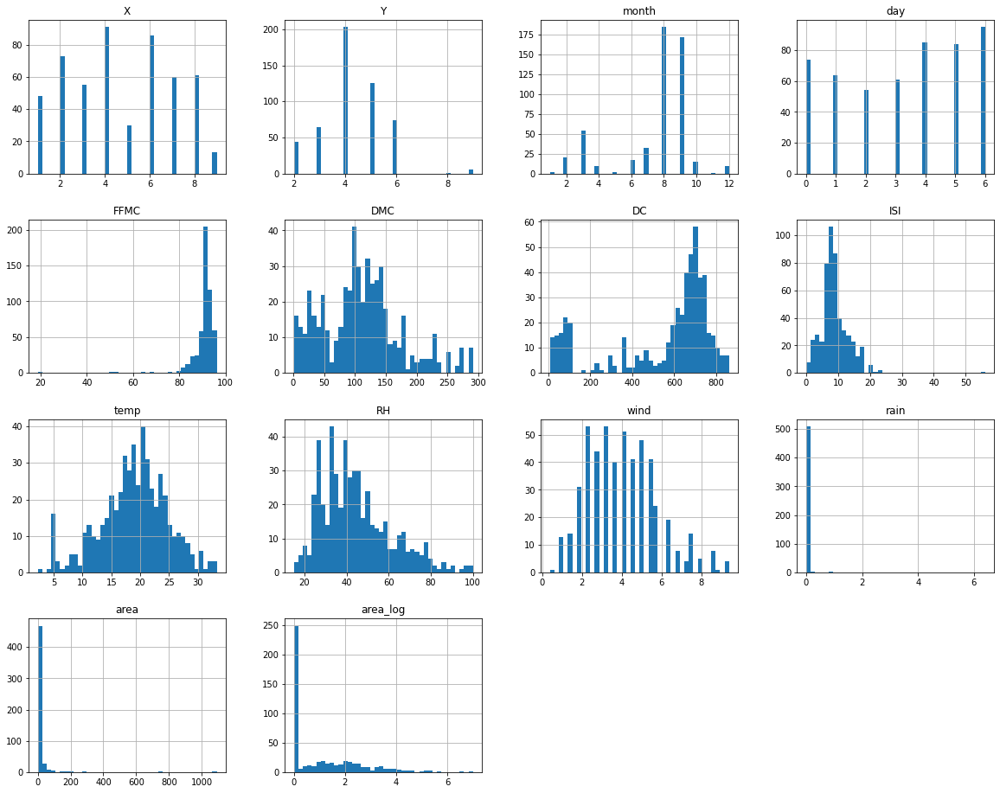

In [6]:
data.hist(figsize=(20,16), bins=40)
plt.show()

Tak jak wcześniej zauważyliśmy, **rain** i **area** są mocno prawoskośne, natomiast okazuje się że **FFMC** jest lewoskośny.  
Widzimy także że **X**, **Y**, **day** i **month** przyjmują jedynie wartości całkowite co nie jest zaskoczeniem.   
To, na co warto jeszcze zwrócić uwagę to znaczna dysproporcja zbieranych pomiarów w zależności od miesiąca.  
Na **wind** widać także pojawiające się "przerwy" na histogramie, najprawdopodobniej spowodowane dokładnością pomiarów.

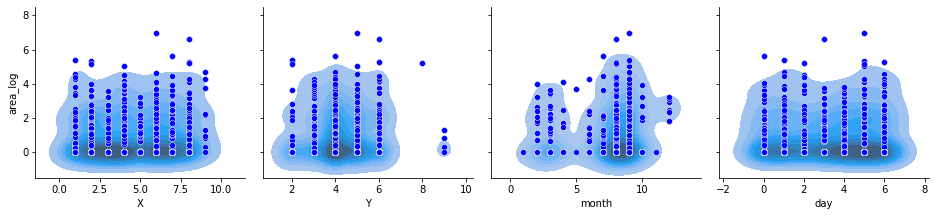

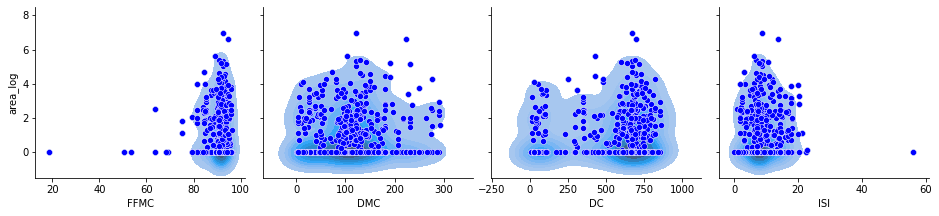

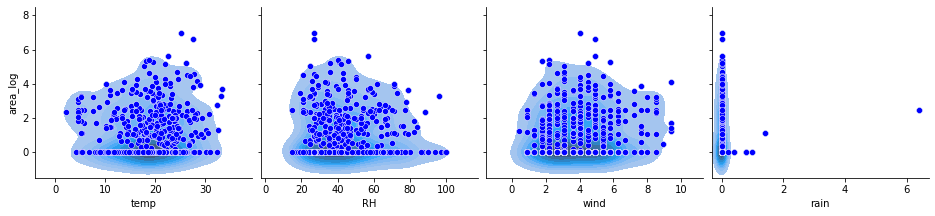

In [7]:
def plots_scat(x_vars, y_vars):
    global data
    g = sns.pairplot(data=data, x_vars=x_vars, y_vars=y_vars, height=3, aspect=1.1)
    g.map(sns.kdeplot, fill=True)
    g.map(sns.scatterplot, color="b")

plots_scat(data.columns.values[:4], "area_log")
plots_scat(data.columns.values[4:8], "area_log")
plots_scat(data.columns.values[8:12], "area_log")
    
plt.show()

Zarówno w **DC** jak i **month** widzimy skupienie danych wokół dwóch wartości. Oba te wykresy wyglądają dosyć podobnie, więc należałoby sprawdzić czy jest tam korelacja.  
Widzimy także że należałoby pozbyć się zmiennej **rain** - jest za mało wartości różnych od zera aby można było coś na jej podstawie wnioskować.

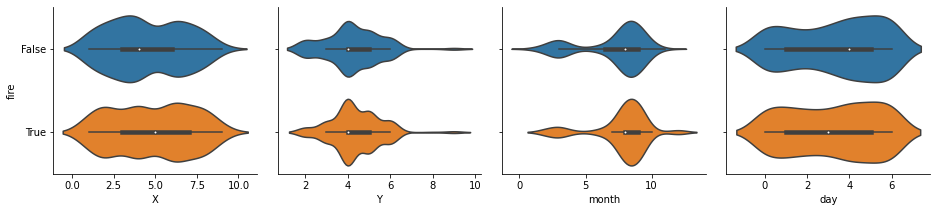

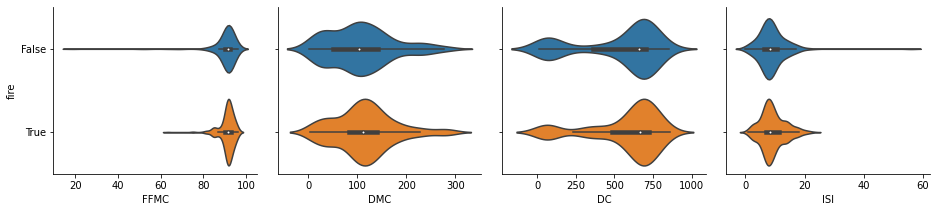

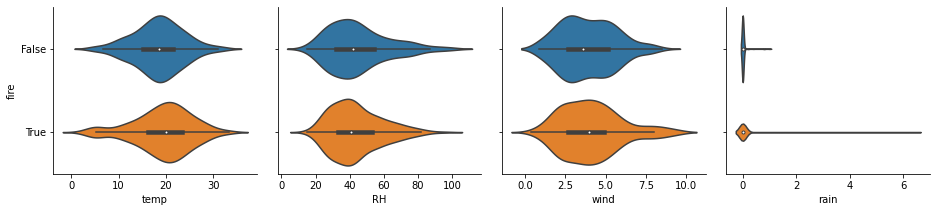

In [8]:
data = data.assign(fire = (data.area>0))
def plots_viol(x_vars, y_vars):
    global data
    g = sns.PairGrid(data=data, x_vars=x_vars, y_vars=y_vars, height=3, aspect=1.1)
    g.map(sns.violinplot, orient="h")

plots_viol(data.columns.values[:4], "fire")
plots_viol(data.columns.values[4:8], "fire")
plots_viol(data.columns.values[8:12], "fire")

plt.show()

Można zauważyć że **temp** jest zwykle większa w przypadku pożarów. Podobną zależność wykazują wskaźniki **DMC** i **DC**. \
Widzimy także znaczące różnice w **month**.

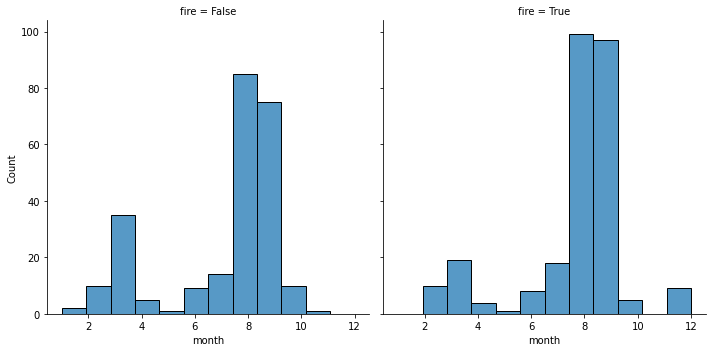

In [9]:
sns.displot(data, x="month", bins=12, col="fire")
plt.show()

Znowu widzimy dysproporcje zbieranych danch, jednak można także zauważyć zwiększoną ilość pożarów w okresie letnim w porównaniu do okresu zimowego, co jest raczej oczywiste.

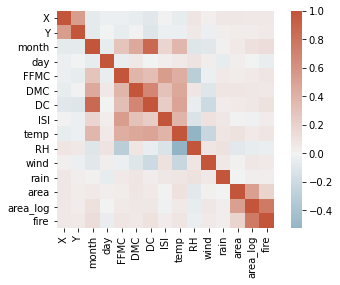

In [10]:
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(data.corr(), cmap=cmap, center=0, square=True)
plt.show()

Nie widać żadnej korelacji dla **area** ani **area_log**, natomiast wskaźniki **FFMC**, **DMC**, **DC** i **ISI** są całkiem ze sobą skorelowane, czego można się było spodziewać.  
Widać także sporo korelacji dla wartości **temp** oraz **month**.

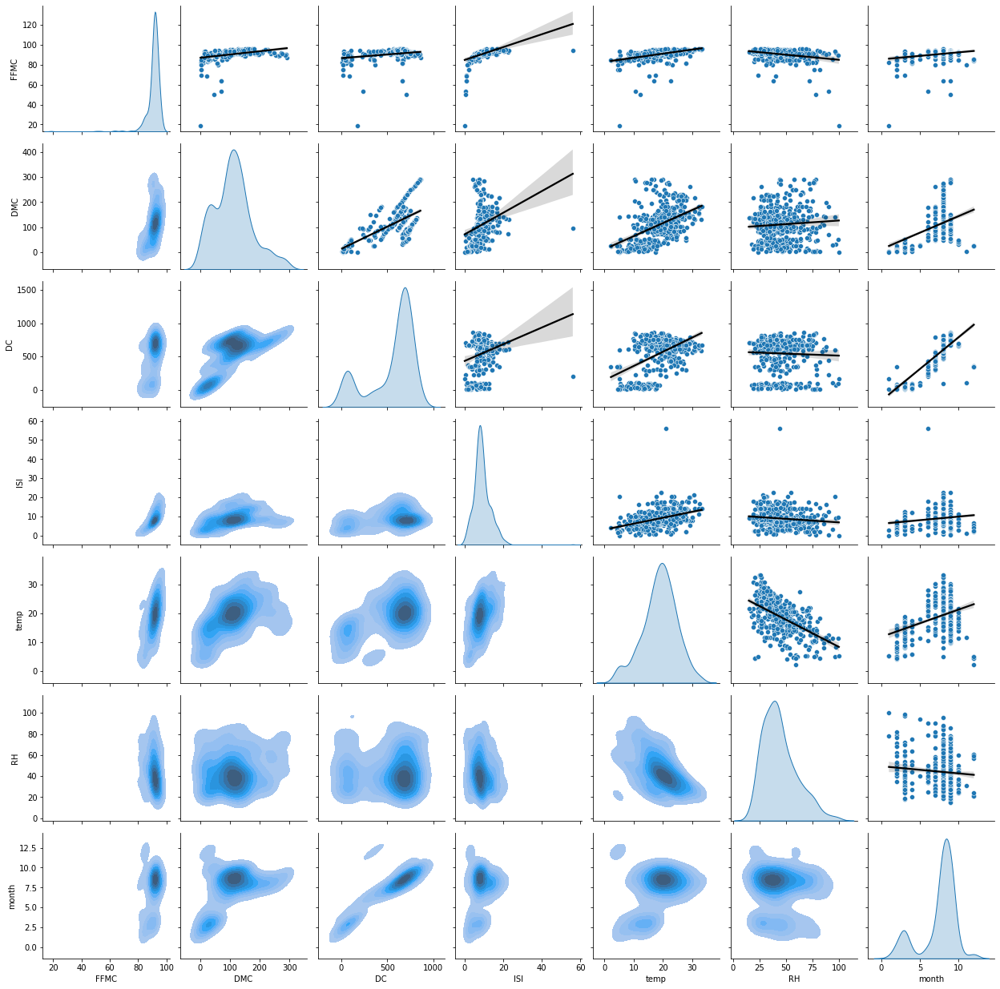

In [11]:
g = sns.pairplot(data[["FFMC","DMC","DC","ISI","temp","RH","month"]], diag_kind="kde", kind="none")
g.map_lower(sns.kdeplot, fill=True)
g.map_upper(sns.scatterplot)
g.map_upper(sns.regplot, scatter=False, color="black")
    
plt.show()

## Automatyczna eksploracja

In [12]:
profile = ProfileReport(data_raw, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Automatyczna eksploracja dała nam nieco więcej informacji na temat analizowanych danych, jednak nadal wymaga aby wartości zostały przekonwertowane na numeryczne. Nie dokonuje ona także przekształceń danych, więc musi być to robione manualnie. Kolejną niedogodnością jest sposób wyświetlania wykresów interakcji - na raz wyświetlany jest tylko jeden taki wykres i należy samemu wybierać dla jakich wartości, zamiast wyświetlania siatki wykresów.